In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml
import time
import gget
from scipy.stats import zscore

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi

import cupy as cp
from cuml.manifold import TSNE
from cuml.decomposition import PCA

sc.settings.verbosity = 3

08:21:38 - INFO - Old pandas version detected. Patching DataFrame.map to DataFrame.applymap
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


In [2]:
%%time
fpath = "/nfs/turbo/umms-indikar/shared/projects/HSC/pipeline_outputs/integrated_anndata/processed.h5ad"
adata = sc.read_h5ad(fpath)
adata.X = adata.layers['log_norm'].copy()
rsc.get.anndata_to_GPU(adata) # move to GPU
adata

CPU times: user 520 ms, sys: 2.73 s, total: 3.25 s
Wall time: 6.92 s


AnnData object with n_obs × n_vars = 15867 × 21412
    obs: 'batch', 'phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_counts', 'n_genes', 'n_reads', 'raw_clusters', 'bbknn_clusters', 'harmony_clusters', 'cluster_str'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_colors', 'bbknn_clusters_colors', 'harmony_clusters_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'rank_genes_grou

# Cluster Analysis

[2025-05-05 08:21:58.800] [CUML] [debug] n_neighbors=355
[2025-05-05 08:21:58.800] [CUML] [debug] Calling knn graph run
[2025-05-05 08:21:58.800] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-05-05 08:21:58.884] [CUML] [debug] Done. Calling remove zeros
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:06)
--> added 'pos', the PAGA positions (adata.uns['paga'])


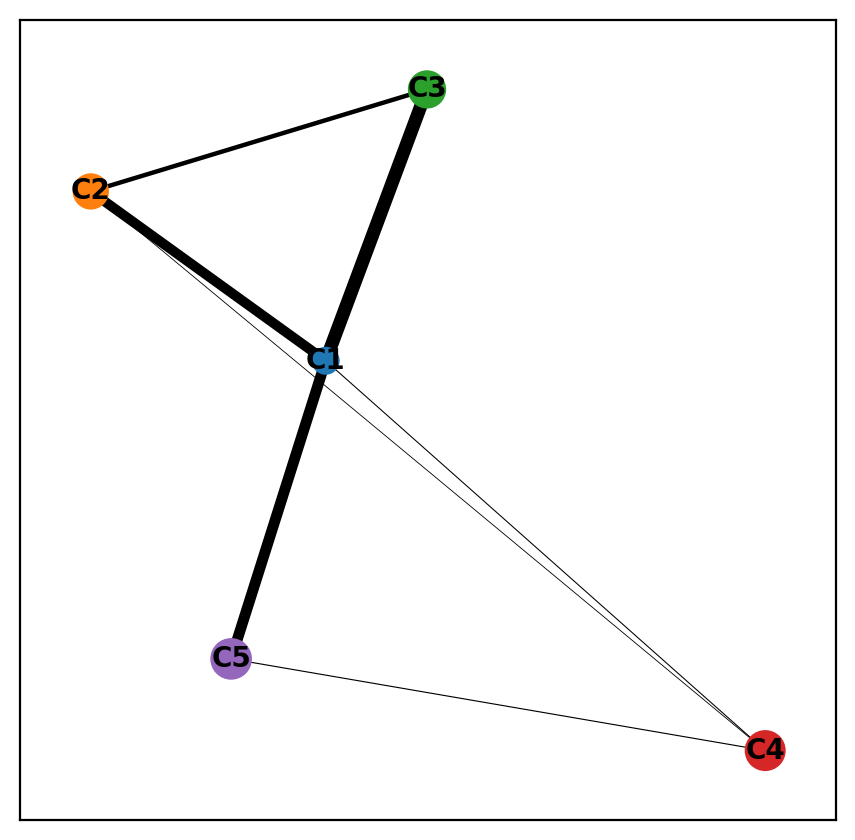

paga.shape=(15867, 2)
CPU times: user 6.26 s, sys: 1.3 s, total: 7.56 s
Wall time: 7.87 s


<Axes: >

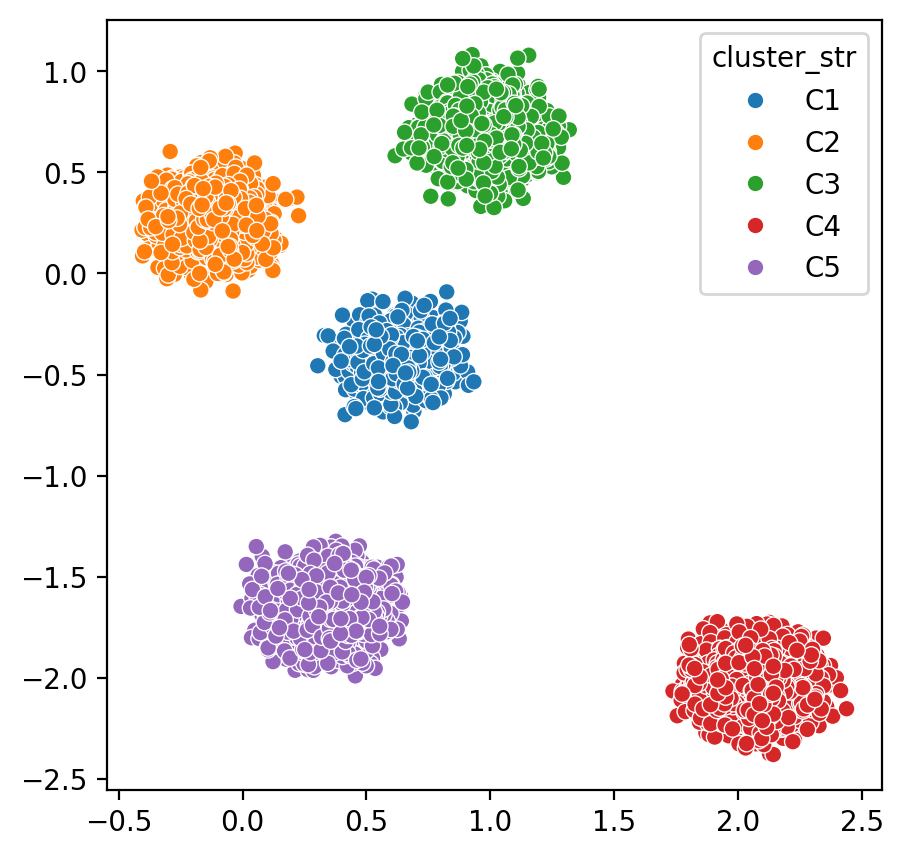

In [3]:
%%time 
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 5

rsc.pp.neighbors(
    adata,
    use_rep='X_pca_harmony',
    n_neighbors=355,
)

sc.tl.paga(
    adata,
    groups="cluster_str",
)

sc.pl.paga(adata) 

def get_init_pos_from_paga(adata):
    groups = adata.obs[adata.uns["paga"]["groups"]]
    pos = adata.uns["paga"]["pos"]
    connectivities = adata.uns["paga"]["connectivities"]
    
    rng = np.random.default_rng()
    init_pos = np.zeros((adata.n_obs, 2))
    
    for i, group in enumerate(groups.cat.categories):
        subset = (groups == group).values
        centroid = pos[i]
        
        # Add Gaussian noise around centroid
        noise = rng.normal(loc=0, scale=0.1, size=(subset.sum(), 2))
        init_pos[subset] = centroid + noise

    return init_pos


paga = get_init_pos_from_paga(adata)
adata.obsm['X_paga'] = cp.array(paga)
print(f"{paga.shape=}")

sns.scatterplot(
    x=paga[:, 0],
    y=paga[:, 1],
    hue=adata.obs['cluster_str'],
)

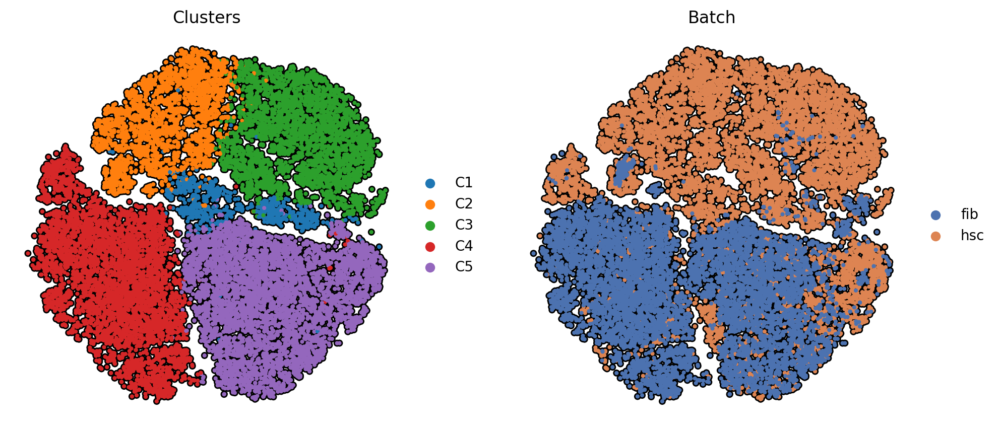

In [4]:
tsne = TSNE(
    n_components=2,
    perplexity=25,
    late_exaggeration=1.1,
)

X = cp.concatenate((
    cp.array(adata.obsm['X_paga']), 
    cp.array(adata.obsm['X_pca_harmony'][:, 0:10]),
), axis=1)

adata.obsm['X_tsne'] = tsne.fit_transform(X).get()

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 5

sc.pl.tsne(
    adata,
    ncols=2,
    color=['cluster_str', 'batch'],   
    size=35,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    frameon=False,
    title=['Clusters', 'Batch'],
)

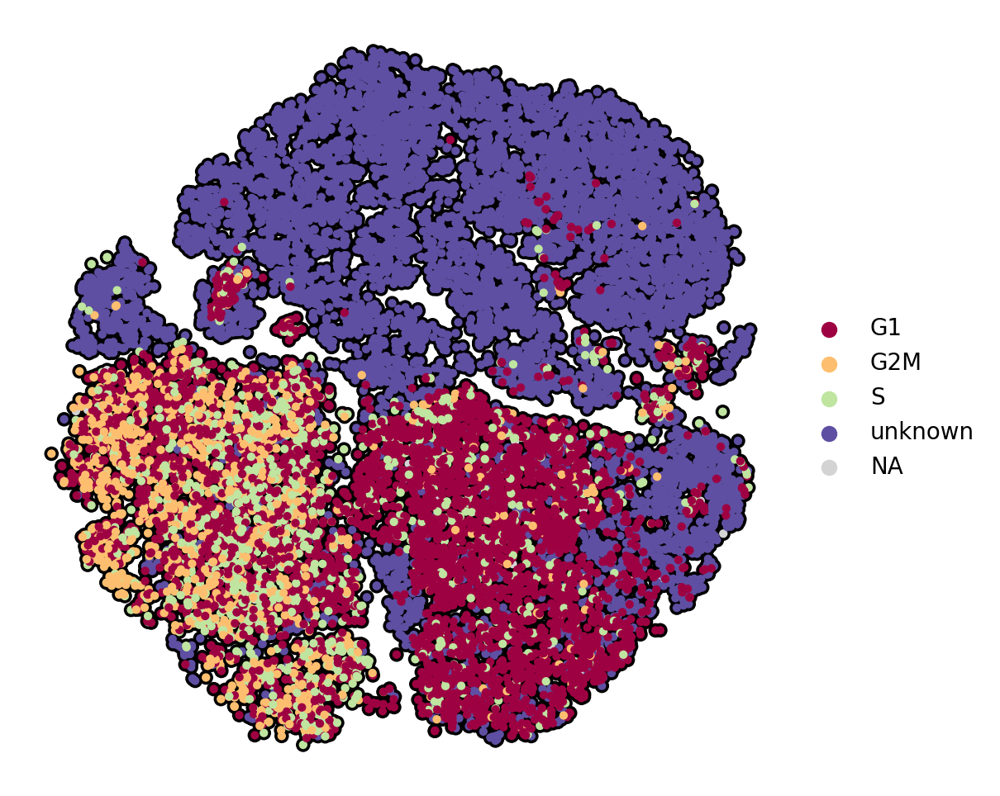

In [5]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6

sc.pl.tsne(
    adata,
    ncols=1,
    color='phase',
    size=55,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    frameon=False,
    title="",
    palette='Spectral',
)

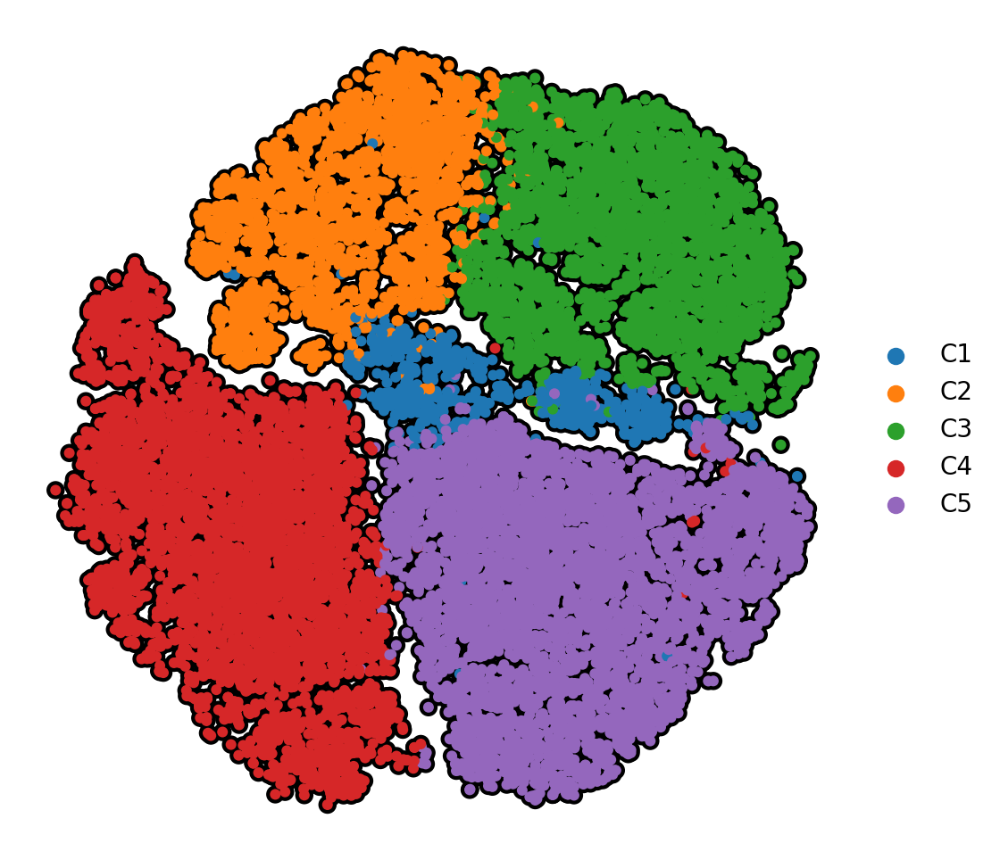

In [6]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6

sc.pl.tsne(
    adata,
    ncols=1,
    color='cluster_str',
    size=75,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    frameon=False,
    # palette='Set1',
    title="",
)

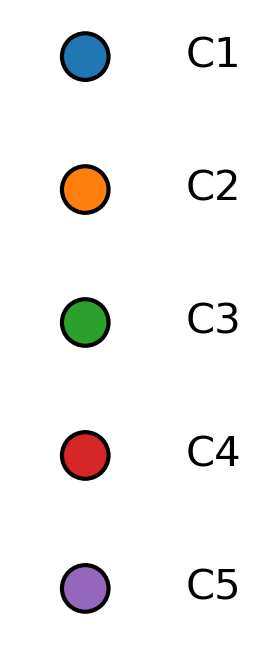

In [128]:
# Reverse order of labels
labels = ['C5', 'C4', 'C3', 'C2', 'C1']
df = pd.DataFrame({
    'x': [0]*5,
    'y': list(range(5)),
    'label': labels
})

# Match the color scheme from your plot
palette = {
    'C1': '#1f77b4',
    'C2': '#ff7f0e',
    'C3': '#2ca02c',
    'C4': '#d62728',
    'C5': '#9467bd'
}

# Plot vertically with reversed order
plt.figure(figsize=(1.25, 2.25))
ax = sns.scatterplot(
    data=df,
    x='x',
    y='y',
    hue='label',
    ec='k',
    lw=1,
    palette=palette,
    s=125,
    legend=False
)

# Add labels to the right of each point
for i, row in df.iterrows():
    ax.text(row['x'] + 0.1, row['y'], row['label'], va='center', fontsize=10)

# Clean up axes
ax.set(xticks=[], yticks=[], xlabel='', ylabel='')
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

# Panel of expression

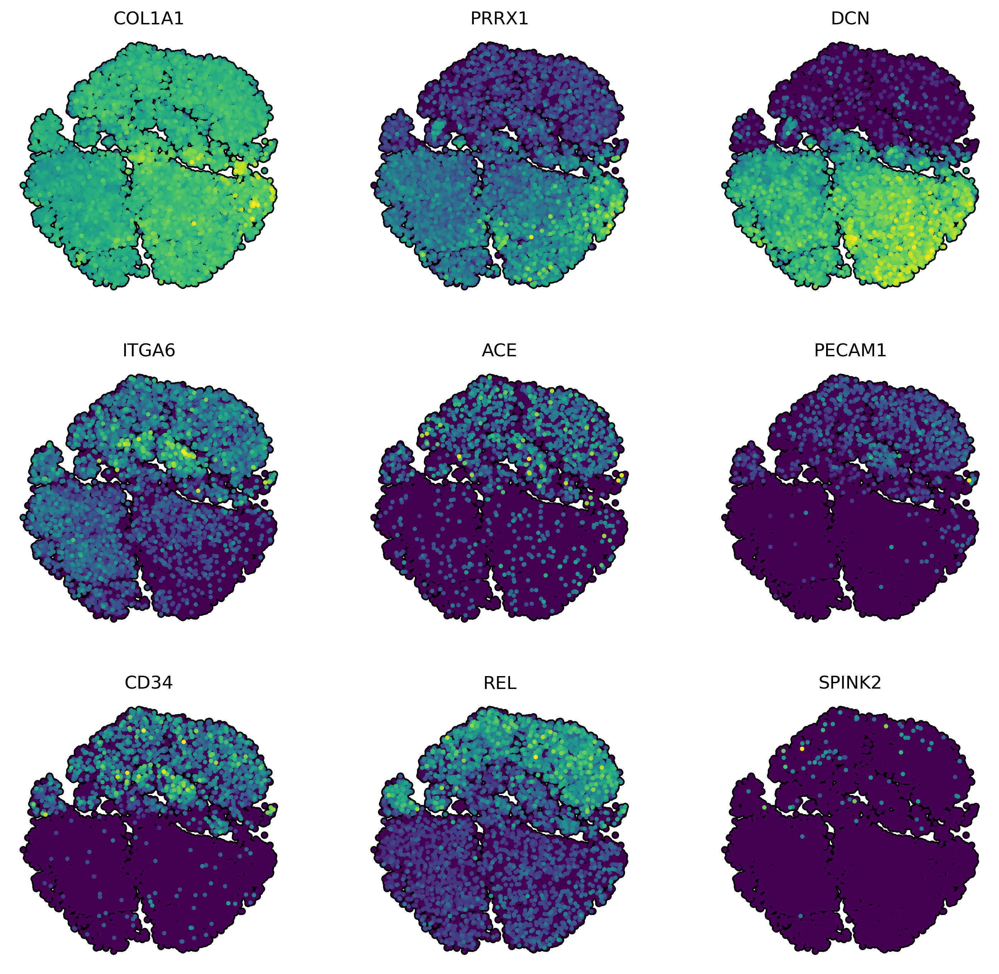

CPU times: user 4.35 s, sys: 216 ms, total: 4.57 s
Wall time: 4.38 s


In [200]:
%%time
rsc.get.anndata_to_CPU(adata)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3.45

color = [
    "COL1A1", "PRRX1",   "DCN", 
    "ITGA6", "ACE", "PECAM1",
    "CD34", "REL", "SPINK2"
]

sc.pl.tsne(
    adata,
    color=color,
    # sort_order=True,
    size=35,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    colorbar_loc=None,
)

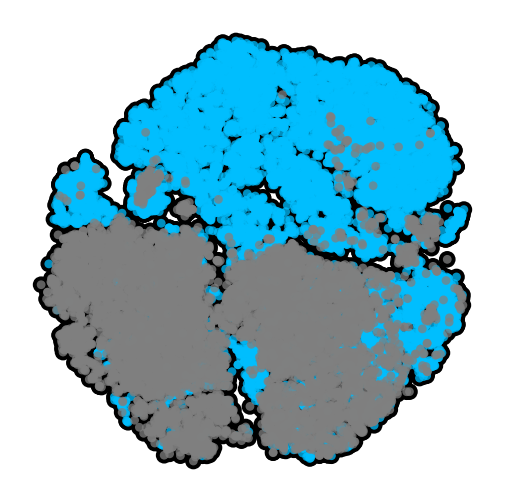

In [87]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(
    data=adata.obs,
    x=adata.obsm['X_tsne'][:, 0],
    y=adata.obsm['X_tsne'][:, 1],
    c='k',
    ec='none',
    zorder=0,
)

sns.scatterplot(
    data=adata.obs,
    x=adata.obsm['X_tsne'][:, 0],
    y=adata.obsm['X_tsne'][:, 1],
    hue='batch',
    s=10,
    ec='none',
    palette=['grey', 'deepskyblue',],
    hue_order=['fib', 'hsc'],
    alpha=0.75,
    legend=False,
)

plt.xticks([])
plt.yticks([])
sns.despine(bottom=True, left=True,)

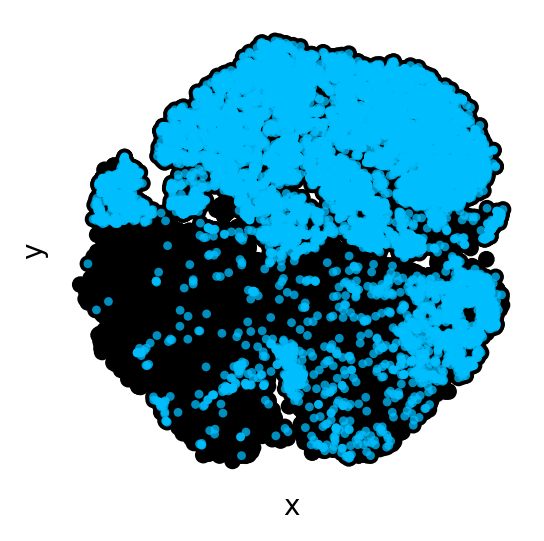

In [89]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

sns.scatterplot(
    data=adata.obs,
    x=adata.obsm['X_tsne'][:, 0],
    y=adata.obsm['X_tsne'][:, 1],
    c='k',
    ec='none',
    zorder=0,
)

pdf = adata.obs.copy()
pdf['x'] = adata.obsm['X_tsne'][:, 0]
pdf['y'] = adata.obsm['X_tsne'][:, 1]
pdf = pdf[pdf['batch'] == 'hsc']

sns.scatterplot(
    data=pdf,
    x='x',
    y='y',
    s=10,
    ec='none',
    c='deepskyblue',
    alpha=0.75,
    legend=False,
)

plt.xticks([])
plt.yticks([])
sns.despine(bottom=True, left=True,)

In [ ]:
# break

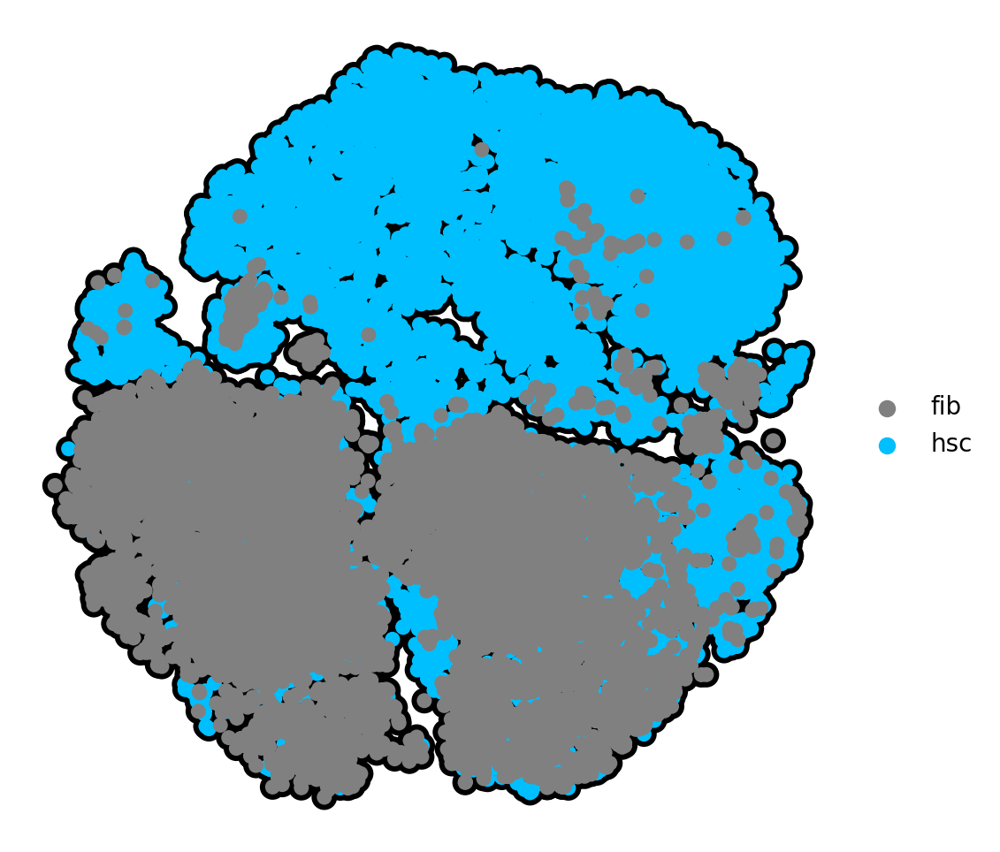

In [55]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6

sc.pl.tsne(
    adata,
    ncols=1,
    color='batch',
    size=150,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    frameon=False,
    palette=['Grey', 'deepskyblue'],
    title="",
)

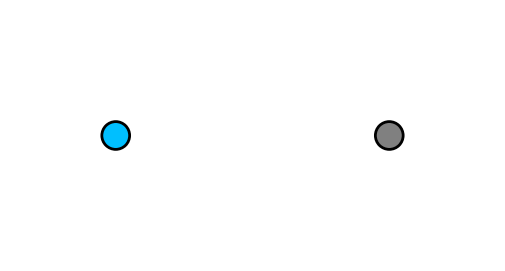

In [27]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 1.5

sns.scatterplot(
    x=[1, 2],
    y=[1, 1],
    hue=[1, 0],
    ec='k',
    lw=1,
    s=100,
    palette=['Grey', 'deepskyblue'],
    legend=False,
)

sns.despine(bottom=True, left=True)
plt.margins(x=0.35)
_ = plt.xticks([])
_ = plt.yticks([])



                    STAT5A  REL  FOS  GATA2  CD34  HHEX  MSI2  RUNX2  ACE  PECAM1  MECOM  ETV6   DCN   LUM   FTL  COL1A1 cluster_str batch  STAT5A+   REL+   FOS+  GATA2+  CD34+  HHEX+  MSI2+  RUNX2+   ACE+  PECAM1+  MECOM+  ETV6+   DCN+   LUM+  FTL+  COL1A1+
TGTGGTTGTAGCCCTA-1     0.0  1.0  4.0    1.0   0.0   0.0   0.0    0.0  0.0     0.0    0.0   0.0  10.0   7.0  96.0    55.0          C5   fib    False   True   True    True  False  False  False   False  False    False   False  False   True   True  True     True
TGTGGTTGTTGAAGGC-1     0.0  0.0  0.0    0.0   0.0   0.0   0.0    0.0  0.0     0.0    0.0   0.0  19.0  13.0  79.0    91.0          C5   fib    False  False  False   False  False  False  False   False  False    False   False  False   True   True  True     True
TGTGTTAGTTGGTAAG-1     0.0  0.0  3.0    1.0   0.0   0.0   0.0    0.0  0.0     0.0    0.0   0.0  21.0  13.0  82.0    46.0          C5   fib    False  False   True    True  False  False  False   False  False    False   False 

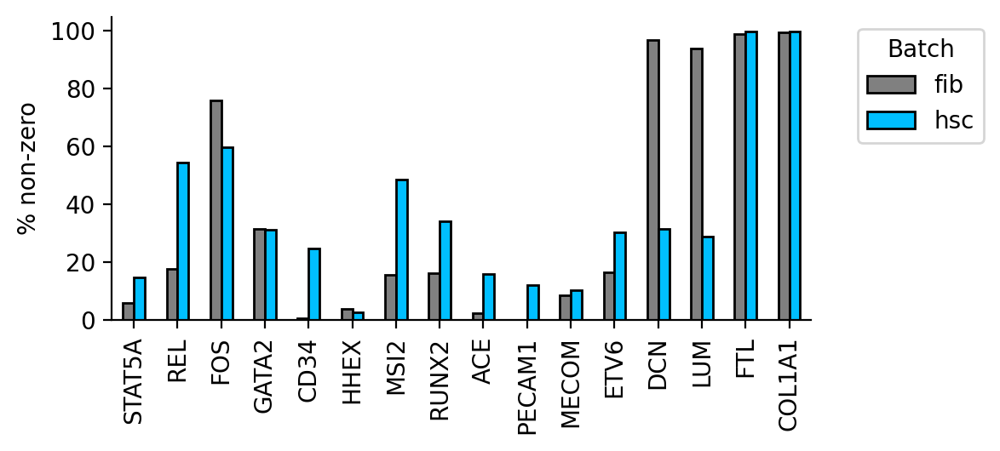

In [126]:
rsc.get.anndata_to_CPU(adata)

query  = [
    'STAT5A',
    'REL',
    'FOS',
    'GATA2',
    'CD34',
    'HHEX',
    'MSI2',
    'RUNX2',
    'ACE',
    'PECAM1',
    'MECOM', 
    'ETV6',
    'DCN',
    'LUM',
    'FTL',
    'COL1A1',
]
pdf = adata[:, query].to_df(layer='raw_counts')
pdf['cluster_str'] = adata.obs['cluster_str']
pdf['batch'] = adata.obs['batch']

for q in query:
    pdf[f'{q}+'] = pdf[q] > 0

print(pdf.tail().to_string())

# Step 3: Calculate % q+ by gene and batch
plot_df = (
    pdf.groupby('batch')[[f'{q}+' for q in query]]
    .mean()
    .T * 100  # Convert to percent
)

plot_df.index = [gene.replace('+', '') for gene in plot_df.index]  # Clean labels

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 2.75

# Step 4: Plot stacked bar chart
plot_df.plot(
    kind='bar',
    ec='k',
    color=['Grey', 'deepskyblue'],
)
plt.ylabel('% non-zero')
plt.legend(title='Batch', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
sns.despine()

plt.gcf().patch.set_facecolor('none')  # Transparent outer figure background
plt.gca().set_facecolor('none')         # Transparent axes (plot area) background
plt.show()


  batch  count
0   hsc   8326
1   fib   7541


/tmp/ipykernel_2897249/3638629253.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


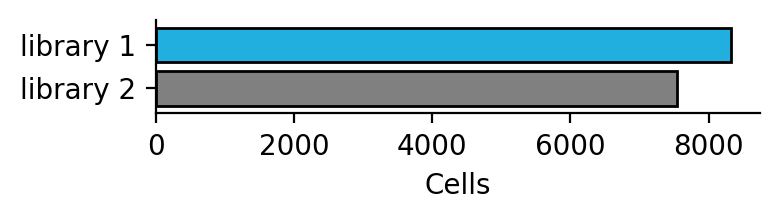

In [122]:
# Prepare data and sort by count descending
batch_counts = adata.obs['batch'].value_counts().reset_index()
batch_counts.columns = ['batch', 'count']
batch_counts = batch_counts.reset_index(drop=True)

print(batch_counts)

# Transposed horizontal barplot with largest bar on top
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 1.2

sns.barplot(
    data=batch_counts,
    y='batch',
    x='count',
    ec='k',
    palette=['Grey', 'deepskyblue']  # first = largest
)

plt.gca().invert_yaxis()

plt.ylabel("")
plt.xlabel("Cells")

# Custom y-axis labels, assuming batch_counts['batch'] has the correct order
plt.gca().set_yticklabels(['library 2', 'library 1'])
plt.margins(y=0.1)

sns.despine()
plt.tight_layout()
plt.show()


# Differential Expression

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:35)


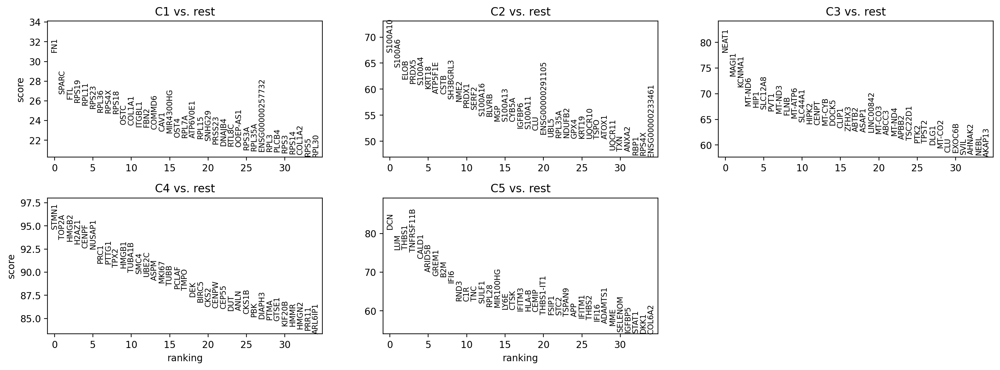

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,C1,FN1,30.910458,2.040230,8.642936e-210,1.850626e-205,0.994005,0.950642
1,C1,SPARC,26.696173,0.978468,5.213877e-157,1.860659e-153,0.994005,0.978980
2,C1,FTL,26.184055,1.032066,4.037250e-151,1.234937e-147,0.995204,0.994678
3,C1,RPS19,25.824425,0.482341,4.715831e-147,1.262192e-143,0.996403,0.996142
4,C1,RPL11,25.576998,0.464369,2.750674e-144,6.544160e-141,0.990408,0.990222


In [161]:
sc.tl.rank_genes_groups(
    adata, 
    groupby='cluster_str',
    method='wilcoxon',
    layer='log_norm',
    use_raw=False,
    pts=True,
)

deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    pval_cutoff=0.05,
)


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 3
sc.pl.rank_genes_groups(
    adata,
    n_genes=35,
    sharey=False,
    ncols=3,
    
)

deg.head()

/tmp/ipykernel_2897249/4011283899.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pdf['label'] = pdf['group'].apply(lambda x: x.replace("_", " "))


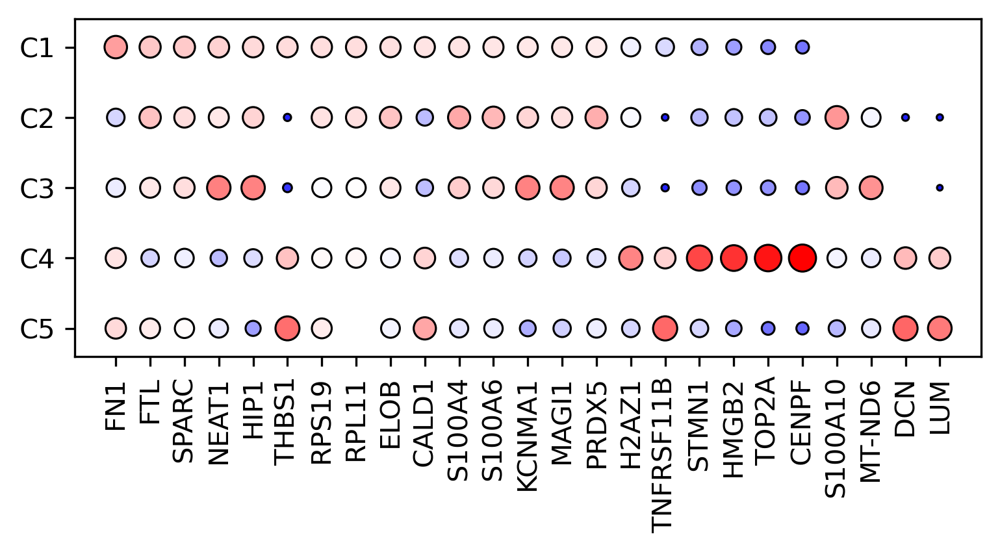

In [162]:
top_n_genes = 5

# filter out genes only expressed in a few cells, robust DEG
pct_nz_group = 0.1
gdf = deg[deg['pct_nz_group'] > pct_nz_group].copy()
gdf = gdf.groupby('group').head(top_n_genes)

deg_genes = gdf['names'].unique()

# now filter the full frame for these genes
pdf = deg[deg['names'].isin(deg_genes)]

pdf['label'] = pdf['group'].apply(lambda x: x.replace("_", " "))
pdf = pdf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6, 2.25

sns.scatterplot(
    data=pdf,
    x='names',
    y='label',
    hue='logfoldchanges',
    size='logfoldchanges',
    sizes=(0, 100),
    ec='k',
    lw=0.75,
    legend=False,
    palette='bwr',
)

plt.margins(y=0.1)
plt.gca().tick_params(axis='x', rotation=90)
plt.ylabel("")
plt.xlabel("")

ax = plt.gca()
y_labels = ax.get_yticklabels()
y_ticks = ax.get_yticks()

In [176]:
logfoldchanges = 1.0
pct_nz_group = 0.1
n_top_genes = 25

columns = [
    'names', 'logfoldchanges', 'pct_nz_group', 'pct_nz_reference'
]

for group_name, group_df in deg.groupby('group'):
    print(f"\ncluster: {group_name}")

    group_df = group_df[group_df['logfoldchanges'] > logfoldchanges]
    group_df = group_df[group_df['pct_nz_group'] > pct_nz_group]
    
    group_df = group_df[~group_df['names'].str.startswith('ENSG')]
    group_df = group_df[~group_df['names'].str.startswith('MT')]

    group_df = group_df.sort_values(by='logfoldchanges', ascending=False)

    print(group_df[columns].head(n_top_genes).to_string(index=False))


cluster: C1
   names  logfoldchanges  pct_nz_group  pct_nz_reference
    SAA1        3.795349      0.447242          0.055145
    GDF6        3.347867      0.158273          0.018360
 TSPAN13        2.878386      0.203837          0.032661
   CLDN7        2.793972      0.109113          0.015965
  FBXO32        2.759691      0.411271          0.098517
KRTAP1-5        2.668248      0.316547          0.063261
   FOXO1        2.633272      0.262590          0.048693
 B3GALT1        2.626344      0.106715          0.019357
   CCND2        2.577358      0.117506          0.018360
   SYPL2        2.576440      0.173861          0.033526
  DIRAS3        2.535753      0.160671          0.035788
    MEST        2.502309      0.272182          0.055678
    RGCC        2.454972      0.125899          0.023415
  SBSPON        2.413387      0.202638          0.039047
  GASK1B        2.396795      0.109113          0.019291
   EFHD1        2.396469      0.252998          0.058272
  LRRC17        2.

# Broad DEG

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:32)


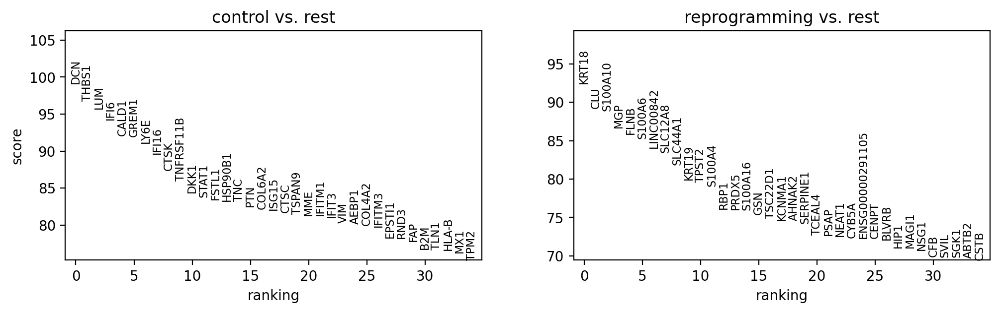

,group,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,control,DCN,99.080986,7.079473,0.0,0.0,0.951788,0.078667
1,control,THBS1,96.784897,6.234342,0.0,0.0,0.945661,0.114701
2,control,LUM,95.664566,6.679245,0.0,0.0,0.921957,0.051091
3,control,IFI6,94.187752,5.505557,0.0,0.0,0.944054,0.432583
4,control,CALD1,92.053505,2.448929,0.0,0.0,0.997991,0.928269


In [178]:
adata.obs['group'] = np.where(adata.obs['cluster_str'].isin(['C2', 'C3']), 'reprogramming', 'control')

sc.tl.rank_genes_groups(
    adata, 
    groupby='group',
    method='wilcoxon',
    layer='log_norm',
    use_raw=False,
    pts=True,
)

deg = sc.get.rank_genes_groups_df(
    adata, 
    group=None,
    pval_cutoff=0.05,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 3
sc.pl.rank_genes_groups(
    adata,
    n_genes=35,
    sharey=False,
    ncols=3,
)

deg.head()

In [179]:
logfoldchanges = 1.0
pct_nz_group = 0.1
n_top_genes = 25

columns = [
    'names', 'logfoldchanges', 'pct_nz_group', 'pct_nz_reference'
]

for group_name, group_df in deg.groupby('group'):
    print(f"\ncluster: {group_name}")

    group_df = group_df[group_df['logfoldchanges'] > logfoldchanges]
    group_df = group_df[group_df['pct_nz_group'] > pct_nz_group]
    
    group_df = group_df[~group_df['names'].str.startswith('ENSG')]
    group_df = group_df[~group_df['names'].str.startswith('MT')]

    group_df = group_df.sort_values(by='logfoldchanges', ascending=False)

    print(group_df[columns].head(n_top_genes).to_string(index=False))


cluster: control
    names  logfoldchanges  pct_nz_group  pct_nz_reference
      DCN        7.079473      0.951788          0.078667
      PTN        7.035806      0.791884          0.017933
      LUM        6.679245      0.921957          0.051091
TNFRSF11B        6.434452      0.837284          0.060227
     CCN3        6.264415      0.275412          0.005414
THBS1-IT1        6.253075      0.720269          0.016579
    THBS1        6.234342      0.945661          0.114701
     BST2        6.220648      0.504319          0.011504
   IGFBP5        5.975657      0.690036          0.049569
      IL6        5.866350      0.194857          0.003553
     MMP1        5.831358      0.381278          0.011504
     GJA1        5.773504      0.595119          0.015903
    GREM1        5.610281      0.910004          0.072407
     IL7R        5.564350      0.444857          0.010996
     PSG5        5.533712      0.719867          0.047369
     IFI6        5.505557      0.944054          0.432

/tmp/ipykernel_2897249/1742374673.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pdf['label'] = pdf['group'].map({


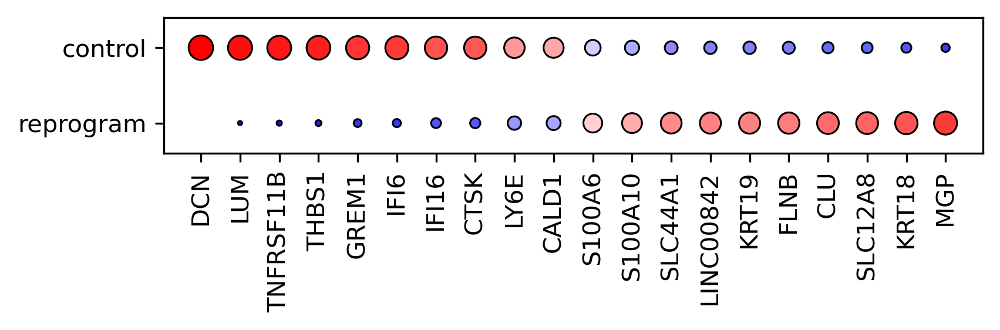

In [180]:
top_n_genes = 10

# filter out genes only expressed in a few cells, robust DEG
pct_nz_group = 0.1
gdf = deg[deg['pct_nz_group'] > pct_nz_group].copy()
gdf = gdf.groupby('group').head(top_n_genes)

deg_genes = gdf['names'].unique()

# now filter the full frame for these genes
pdf = deg[deg['names'].isin(deg_genes)]

pdf['label'] = pdf['group'].map({
    "control" : "control",
    "reprogramming" : "reprogram",
})
pdf = pdf.sort_values(by=['group', 'logfoldchanges'], ascending=[True, False])

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6, 1

sns.scatterplot(
    data=pdf,
    x='names',
    y='label',
    hue='logfoldchanges',
    size='logfoldchanges',
    sizes=(0, 100),
    ec='k',
    lw=0.75,
    legend=False,
    palette='bwr',
)

plt.margins(y=0.4)
plt.gca().tick_params(axis='x', rotation=90)
plt.ylabel("")
plt.xlabel("")

ax = plt.gca()
y_labels = ax.get_yticklabels()
y_ticks = ax.get_yticks()

In [10]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

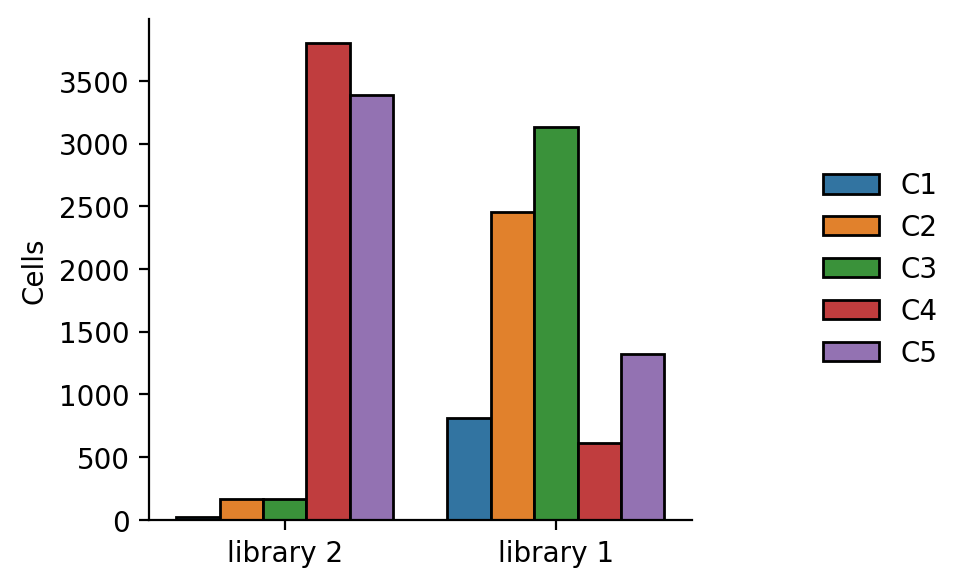

In [183]:
df = adata.obs[['batch', 'cluster_str']].value_counts().reset_index(name='count')

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3.5, 3.25

sns.barplot(
    data=df,
    x='batch',
    y='count',
    hue='cluster_str',
    ec='k',
)

plt.xlabel("")
plt.ylabel("Cells")
plt.gca().set_xticklabels(['library 2', 'library 1'])
sns.move_legend(
    plt.gca(),
    loc='center right',
    title="",
    frameon=False,
    bbox_to_anchor=(1.5, 0.5),
)


sns.despine()

In [ ]:
break

In [184]:
# Create a frequency table of 'batch' and 'cluster_str'
df = adata.obs[['batch', 'cluster_str']].value_counts().reset_index(name='count')

# Calculate percentage within each batch (dataset)
df['percentage'] = df.groupby('batch')['count'].transform(lambda x: 100 * x / x.sum())

# Optionally, round the percentage to one decimal place

df['percentage'] = df['percentage'].round(1)

# Sort by dataset ('batch') and then by count (descending order)
df = df.sort_values(by=['batch', 'cluster_str'], ascending=[True, True])

# Print the table without the default DataFrame index
print(df.to_latex(index=False))

\begin{tabular}{llrr}
\toprule
batch & cluster_str & count & percentage \\
\midrule
fib & C1 & 23 & 0.300000 \\
fib & C2 & 165 & 2.200000 \\
fib & C3 & 163 & 2.200000 \\
fib & C4 & 3803 & 50.400000 \\
fib & C5 & 3387 & 44.900000 \\
hsc & C1 & 811 & 9.700000 \\
hsc & C2 & 2454 & 29.500000 \\
hsc & C3 & 3129 & 37.600000 \\
hsc & C4 & 611 & 7.300000 \\
hsc & C5 & 1321 & 15.900000 \\
\bottomrule
\end{tabular}



In [ ]:
# break

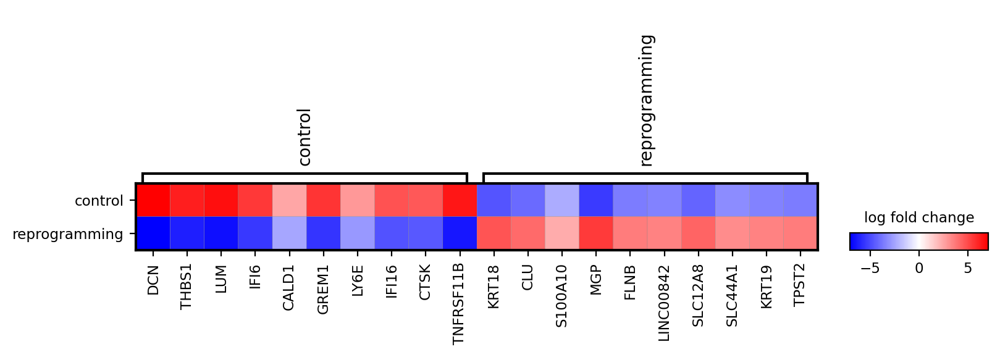

In [185]:
sc.pl.rank_genes_groups_matrixplot(
    adata,
    values_to_plot="logfoldchanges",
    cmap='bwr',
    # vmin=-4,
    # vmax=4,
    min_logfoldchange=1.5,
    colorbar_title='log fold change',
)

sig.shape=(10, 8)
        group     names    scores  logfoldchanges  pvals  pvals_adj  pct_nz_group  pct_nz_reference
      control       DCN 99.080986        7.079473    0.0        0.0      0.951788          0.078667
      control       PTN 82.491547        7.035806    0.0        0.0      0.791884          0.017933
      control       LUM 95.664566        6.679245    0.0        0.0      0.921957          0.051091
      control TNFRSF11B 85.931519        6.434452    0.0        0.0      0.837284          0.060227
      control THBS1-IT1 74.371429        6.253075    0.0        0.0      0.720269          0.016579
reprogramming       MGP 86.698891        5.430586    0.0        0.0      0.932160          0.234030
reprogramming     KRT18 92.404861        4.723639    0.0        0.0      0.940958          0.394938
reprogramming      RBP1 76.064079        4.675192    0.0        0.0      0.777872          0.081358
reprogramming   SLC12A8 83.423203        4.277648    0.0        0.0      0.861783 

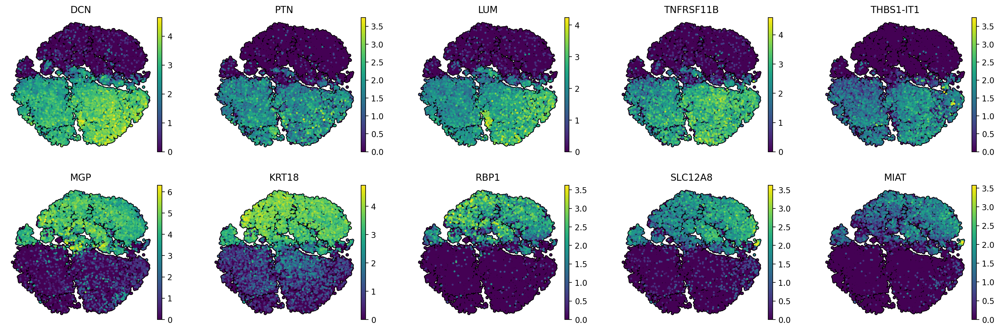

In [187]:
n_genes = 5
sig = deg.copy()
sig = sig[sig['pct_nz_group'] > 0.5]
sig = sig[sig['logfoldchanges'] > 1.5]
sig = sig.sort_values(['group', 'logfoldchanges'], ascending=[True, False])

sig = sig.groupby('group').head(n_genes)
print(f"{sig.shape=}")
print(sig.to_string(index=False))

sc.pl.tsne(
    adata,
    ncols=n_genes,
    color=sig['names'],   
    size=25,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='viridis',
    layer='log_norm',
    frameon=False,
)


In [188]:
n_genes = 35
sig = deg.copy()
sig = sig[sig['pct_nz_group'] > 0.5]
sig = sig[sig['logfoldchanges'] > 1.5]
sig = sig[sig['group'] == 'reprogramming']
sig = sig.sort_values(['group', 'logfoldchanges'], ascending=[True, False])

sig = sig.head(n_genes)
print(sig['names'])
print(sig[['names', 'logfoldchanges', 'pct_nz_group', 'pct_nz_reference']].to_string(index=False))

10381                MGP
10378              KRT18
10390               RBP1
10385            SLC12A8
10431               MIAT
10379                CLU
10407               NSG1
10483              CALB2
10434               NEBL
10388              TPST2
10382               FLNB
10472    ENSG00000276850
10462                JUP
10470            SLC35F3
10387              KRT19
10418             PLAAT3
10408                CFB
10384          LINC00842
10430              MORC3
10396             AHNAK2
10411              ABTB2
10425              PRSS3
10441               GAS7
10386            SLC44A1
10440              ASAP2
10403              CENPT
10503             CHAF1B
10438             PRUNE2
10436              CLIC3
10456             SH3BP5
10486              EFNA5
10517               CA12
10453              FKBP5
10464          MIR193BHG
10469               FHIT
Name: names, dtype: object
          names  logfoldchanges  pct_nz_group  pct_nz_reference
            MGP        5.430586   

# Pathway Genes

In [190]:
def load_pathway(fpath):
    """
    Loads an Enrichr-like database file into a boolean DataFrame.

    Args:
        fpath (str): Path to the Enrichr-like database file.

    Returns:
        pandas.DataFrame: A boolean DataFrame where:
            - Index: Genes
            - Columns: Pathways
            - Values: True if the gene is in the pathway, False otherwise.
    """

    result = []
    with open(fpath,  encoding='utf-8') as f:
        for line in f:
            split_line = [x for x in line.strip().split('\t') if x]  # Remove empty strings directly

            row = {'label': split_line[0]}
            for gene in split_line[1:]:
                row[gene] = 1

            result.append(row)

    df = pd.DataFrame(result)
    df = df.fillna(0.0).set_index('label').astype(bool).T  # Chained operations for clarity

    return df

# PanglaoDB

In [192]:
fpath = "../../resources/PanglaoDB_Augmented_2021.txt"
pdf = load_pathway(fpath)
cell_types = ['Hematopoietic Stem Cells', 'Endothelial Cells', 'Fibroblasts']

sig = deg.copy()
pct_nz_group = 0.1
logfoldchanges = 1.5
sig = sig[sig['pct_nz_group'] > pct_nz_group]
sig = sig[sig['logfoldchanges'] > logfoldchanges]

print("PanglaoDB Marker Genes")
print(f"\t Percent cell non-zero {pct_nz_group}")
print(f"\t Minimum log fold change {logfoldchanges}")

queries = {}
for ct in cell_types:
    marker_genes = list(pdf[pdf[ct]].index)
    query = sig[sig['names'].isin(marker_genes)]
    unique_genes = list(query['names'].unique())
    queries[ct] = query
    print(f"\n{ct} {len(marker_genes)} genes ({len(query)} DEG)")
    print(f"\t {query[query['group'] == 'control'].shape[0]} genes up in control")
    print(f"\t {query[query['group'] == 'reprogramming'].shape[0]} genes up in reprogramming")

        
print('done')

PanglaoDB Marker Genes
	 Percent cell non-zero 0.1
	 Minimum log fold change 1.5

Hematopoietic Stem Cells 178 genes (18 DEG)
	 11 genes up in control
	 7 genes up in reprogramming

Endothelial Cells 246 genes (47 DEG)
	 34 genes up in control
	 13 genes up in reprogramming

Fibroblasts 232 genes (86 DEG)
	 73 genes up in control
	 13 genes up in reprogramming
done


In [ ]:
n_genes = 3
for k, sig in queries.items():
    sig = sig.sort_values(['group', 'logfoldchanges'], ascending=[True, False])

    sig = sig.groupby('group').head(n_genes)
    print(f"{sig.shape=}")

    if sig.shape[0] == 0:
        continue

    sig['titles'] = sig['names'].astype(str) + " (lfc=" + sig['logfoldchanges'].round(1).astype(str) + ")"
    print(sig.to_string(index=False))
    
    axes = sc.pl.umap(
        adata,
        ncols=n_genes,
        color=sig['names'].tolist(), # Ensure it's a list if it's a Series
        size=25,
        add_outline=True,
        outline_color=('k', 'k'),
        alpha=1,
        cmap='viridis',
        layer='log_norm',
        frameon=False,
        title=sig['titles'].tolist(), # Ensure it's a list if it's a Series
        show=False 
    )
    fig = plt.gcf()
    fig.suptitle(f"{k}", fontsize=16) 
    plt.show()

# Other Endothelial Markers

In [ ]:
query = [
    "MAGI1", "PECAM1", "NDRG4", "NYAP1", "CMTM4", "SHROOM2", "GPRC5B", "NGEF",
]

sc.pl.umap(
    adata,
    ncols=4,
    color=query,   
    size=25,
    add_outline=True,
    outline_color=('k', 'k'),
    alpha=1,
    cmap='viridis',
    layer='log_norm',
    frameon=False,
)


# Tabula Sapiens

In [ ]:
fpath = "../../resources/Tabula_Sapiens.txt"
pdf = load_pathway(fpath)

search_types = {
    'hemat' : 'HSC',
    'fibroblast' : 'Fibroblast',
    'endoth' : 'Endothelial',
}

search_terms = {}
for search, label in search_types.items():
    search_terms[label] = [x for x in pdf.columns if search in x.lower()]

sig = deg.copy()
pct_nz_group = 0.15
logfoldchanges = 1.5
sig = sig[sig['pct_nz_group'] > pct_nz_group]
sig = sig[sig['logfoldchanges'] > logfoldchanges]

print("Tabula Sapiens Marker Genes")
print(f"\t Percent cell non-zero {pct_nz_group}")
print(f"\t Minimum log fold change {logfoldchanges}")

queries = {}
for label, columns in search_terms.items():
    marker_genes = list(pdf[pdf[columns].any(axis=1)].index)

    query = sig[sig['names'].isin(marker_genes)]
    unique_genes = list(query['names'].unique())
    queries[label] = query
    print(f"\n{label} {len(marker_genes)} genes ({len(query)} DEG)")
    print(f"\t {query[query['group'] == 'control'].shape[0]} genes up in control")
    print(f"\t {query[query['group'] == 'reprogramming'].shape[0]} genes up in reprogramming")
    # break

        
print('done')

In [ ]:
n_genes = 3
for k, sig in queries.items():
    if k == 'HSC':
        continue
    sig = sig.sort_values(['group', 'logfoldchanges'], ascending=[True, False])

    sig = sig.groupby('group').head(n_genes)
    print(f"{sig.shape=}")

    
    if sig.shape[0] == 0:
        continue

    sig['titles'] = sig['names'].astype(str) + " (lfc=" + sig['logfoldchanges'].round(1).astype(str) + ")"
    print(sig.to_string(index=False))
    
    axes = sc.pl.umap(
        adata,
        ncols=n_genes,
        color=sig['names'].tolist(), # Ensure it's a list if it's a Series
        size=25,
        add_outline=True,
        outline_color=('k', 'k'),
        alpha=1,
        cmap='viridis',
        layer='log_norm',
        frameon=False,
        title=sig['titles'].tolist(), # Ensure it's a list if it's a Series
        show=False 
    )
    fig = plt.gcf()
    fig.suptitle(f"{k}", fontsize=16) 
    plt.show()

# A new embedding